<a href="https://colab.research.google.com/github/rak-shi/Machine_learning_task1/blob/main/ML_Engineer_task_Rakshitha.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
!pip install opencv-python mediapipe ffmpeg-python


In [8]:
import cv2
import mediapipe as mp
import numpy as np


In [15]:
!unzip -q /content/07_ok.zip -d ./data

In [21]:
!unzip -q /content/s7_processed.zip -d ./data1

[/content/s7_processed.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/s7_processed.zip or
        /content/s7_processed.zip.zip, and cannot find /content/s7_processed.zip.ZIP, period.


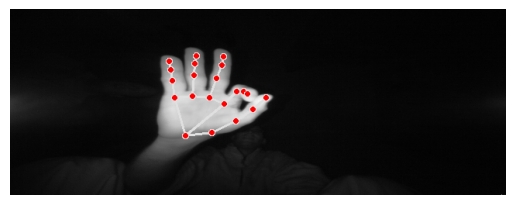

In [9]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands()

# Load the image
image = cv2.imread('/content/frame_01_07_0001.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Process the image and detect hands
results = hands.process(image_rgb)

# Display the image with hand landmarks
if results.multi_hand_landmarks:
    for landmarks in results.multi_hand_landmarks:
        mp.solutions.drawing_utils.draw_landmarks(image, landmarks, mp_hands.HAND_CONNECTIONS)

# Convert image back to BGR and show it
image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
plt.imshow(image_bgr)
plt.axis('off')
plt.show()



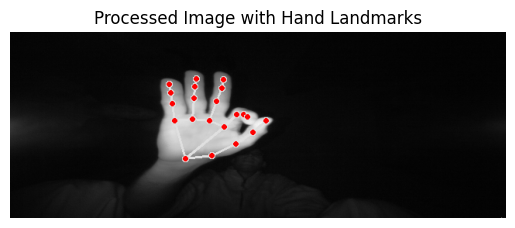

Processed image saved at: /content/output_with_landmarks.png
Hand landmark coordinates saved at: /content/hand_landmarks.txt


In [10]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import os

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands()

# Load the image
image_path = '/content/frame_01_07_0001.png'
output_path = '/content/output_with_landmarks.png'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Process the image and detect hands
results = hands.process(image_rgb)

# Extract and save hand landmark coordinates
landmark_data = []
if results.multi_hand_landmarks:
    for hand_idx, landmarks in enumerate(results.multi_hand_landmarks):
        # Draw landmarks and connections on the image
        mp.solutions.drawing_utils.draw_landmarks(image, landmarks, mp_hands.HAND_CONNECTIONS)

        # Extract landmark coordinates
        for landmark_id, landmark in enumerate(landmarks.landmark):
            h, w, c = image.shape  # Get image dimensions
            x, y, z = int(landmark.x * w), int(landmark.y * h), landmark.z
            landmark_data.append((hand_idx, landmark_id, x, y, z))

# Save the processed image
cv2.imwrite(output_path, image)

# Convert image back to BGR for displaying with matplotlib
image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Show the processed image
plt.imshow(image_bgr)
plt.axis('off')
plt.title("Processed Image with Hand Landmarks")
plt.show()

# Save the extracted landmarks to a file (optional)
landmark_file = '/content/hand_landmarks.txt'
with open(landmark_file, 'w') as f:
    f.write("Hand_Index, Landmark_ID, X, Y, Z\n")
    for data in landmark_data:
        f.write(f"{data[0]}, {data[1]}, {data[2]}, {data[3]}, {data[4]}\n")

print(f"Processed image saved at: {output_path}")
print(f"Hand landmark coordinates saved at: {landmark_file}")


In [11]:
import numpy as np

def normalize_landmarks(landmarks):
    wrist = np.array([landmarks[0].x, landmarks[0].y, landmarks[0].z])
    normalized = []
    for landmark in landmarks:
        point = np.array([landmark.x, landmark.y, landmark.z])
        normalized.append((point - wrist).tolist())
    max_distance = max(np.linalg.norm(np.array(normalized), axis=1))
    normalized = np.array(normalized) / max_distance
    return normalized


In [13]:
def is_ok_gesture(landmarks, image_width, image_height):
    # Get necessary landmark positions
    thumb_tip = landmarks[4]
    index_tip = landmarks[8]
    middle_tip = landmarks[12]
    ring_tip = landmarks[16]
    pinky_tip = landmarks[20]

    # Convert to pixel coordinates
    thumb_tip_x, thumb_tip_y = int(thumb_tip.x * image_width), int(thumb_tip.y * image_height)
    index_tip_x, index_tip_y = int(index_tip.x * image_width), int(index_tip.y * image_height)

    # Distance between thumb tip and index tip
    distance = ((thumb_tip_x - index_tip_x) ** 2 + (thumb_tip_y - index_tip_y) ** 2) ** 0.5

    # Check if thumb and index fingers form a circle (distance is small)
    # AND other fingers are extended (y-coordinates of tips are higher than base joints)
    is_circle = distance < 30  # Adjust threshold based on image resolution
    is_other_fingers_extended = (
        middle_tip.y < landmarks[9].y and  # Middle finger extended
        ring_tip.y < landmarks[13].y and  # Ring finger extended
        pinky_tip.y < landmarks[17].y     # Pinky extended
    )

    return is_circle and is_other_fingers_extended


# Detect landmarks
if results.multi_hand_landmarks:
    h, w, c = image.shape  # Image dimensions
    for hand_landmarks in results.multi_hand_landmarks:
        if is_ok_gesture(hand_landmarks.landmark, w, h):
            print("OK Gesture Detected!")
        else:
            print("No OK Gesture Detected!")


OK Gesture Detected!


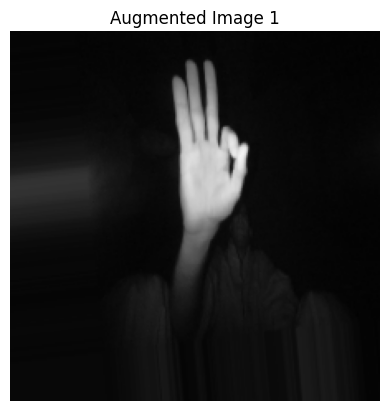

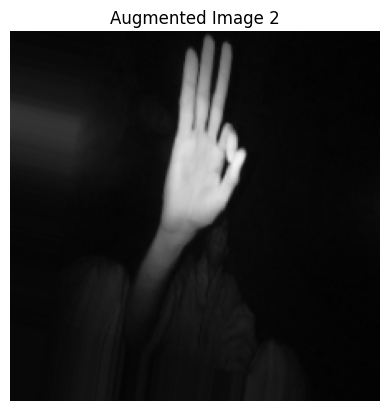

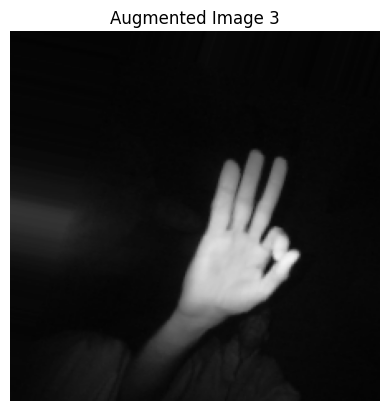

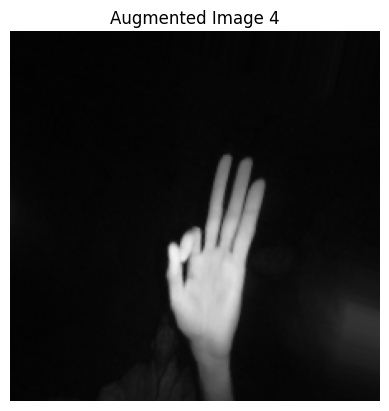

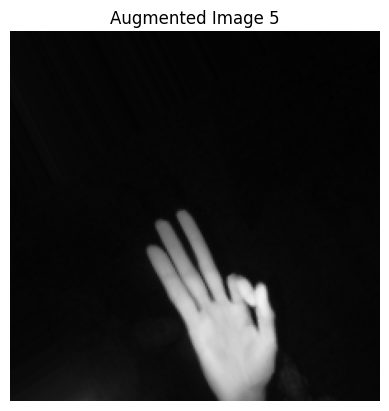

Augmented images saved in /content/augmented_gesture_data


In [16]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt
import numpy as np

# Path to gesture dataset
gesture_dataset_path = '/content/data'  # Replace with your dataset path
augmented_data_path = '/content/augmented_gesture_data'
os.makedirs(augmented_data_path, exist_ok=True)

# Initialize ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=30,       # Random rotation
    width_shift_range=0.2,   # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,         # Shear transformations
    zoom_range=0.2,          # Zoom in/out
    horizontal_flip=True,    # Flip horizontally
    fill_mode='nearest'      # Fill empty pixels after transformation
)

# Example: Applying augmentation to a single gesture image
gesture_image_path = '/content/frame_01_07_0001.png'  # Replace with an actual gesture image
image = tf.keras.preprocessing.image.load_img(gesture_image_path, target_size=(224, 224))  # Resize to model input size
image_array = tf.keras.preprocessing.image.img_to_array(image)  # Convert to numpy array
image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

# Generate augmented images and visualize them
augmented_images = datagen.flow(image_array, batch_size=1)

# Save or visualize augmented images
for i in range(5):  # Generate 5 augmented images
    augmented_image = next(augmented_images)[0].astype('uint8')
    plt.figure()
    plt.imshow(augmented_image)
    plt.axis('off')
    plt.title(f"Augmented Image {i+1}")
    plt.show()

# Batch augmentation for the entire dataset
for gesture_folder in os.listdir(gesture_dataset_path):
    input_folder = os.path.join(gesture_dataset_path, gesture_folder)
    output_folder = os.path.join(augmented_data_path, gesture_folder)
    os.makedirs(output_folder, exist_ok=True)

    for image_file in os.listdir(input_folder):
        image_path = os.path.join(input_folder, image_file)
        img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate and save augmented images
        counter = 0
        for batch in datagen.flow(img_array, batch_size=1, save_to_dir=output_folder,
                                  save_prefix='aug', save_format='jpg'):
            counter += 1
            if counter >= 5:  # Generate 5 augmented images per input image
                break

print(f"Augmented images saved in {augmented_data_path}")


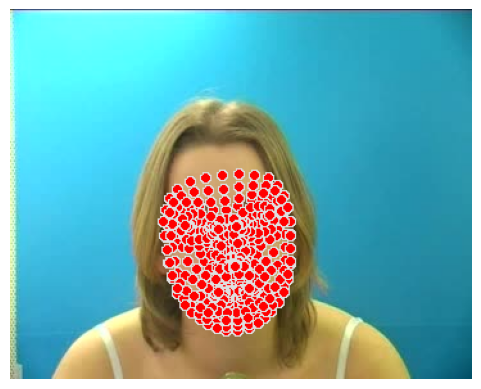

In [17]:
import subprocess
import os
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

# Path to your MPG video
input_video_path = '/content/bbal1s.mpg'

# Create a directory to store extracted frames
output_dir = 'output_frames'
os.makedirs(output_dir, exist_ok=True)

# Use subprocess to run ffmpeg command to extract frames
subprocess.run(['ffmpeg', '-i', input_video_path, os.path.join(output_dir, 'frame_%04d.jpg')])

# Read a frame (example: the first frame)
frame_path = os.path.join(output_dir, 'frame_0001.jpg')
frame = cv2.imread(frame_path)

# Convert to RGB for MediaPipe
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Initialize MediaPipe FaceMesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh()

# Process the frame and detect face landmarks
results = face_mesh.process(frame_rgb)

# Draw the landmarks on the frame
if results.multi_face_landmarks:
    for landmarks in results.multi_face_landmarks:
        mp.solutions.drawing_utils.draw_landmarks(frame, landmarks, mp_face_mesh.FACEMESH_LIPS)

# Show the processed frame with lip landmarks
frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
plt.imshow(frame_bgr)
plt.axis('off')
plt.show()


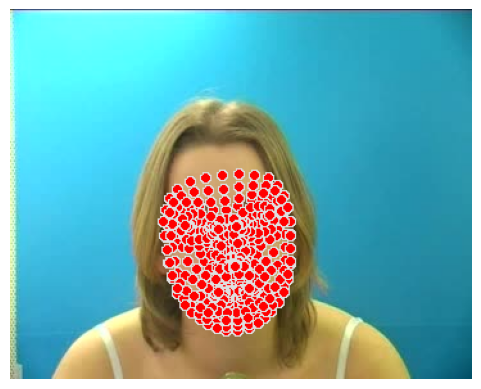

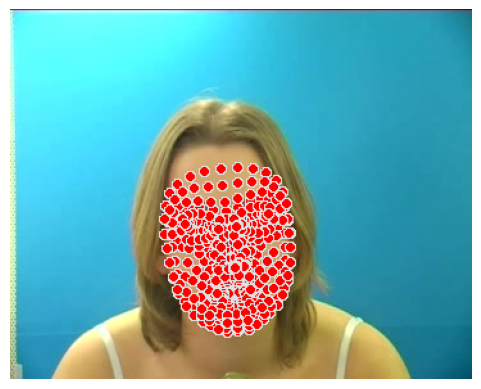

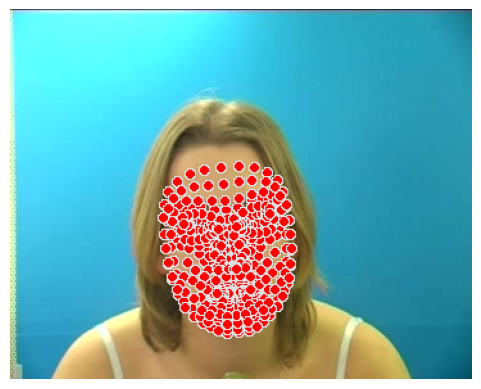

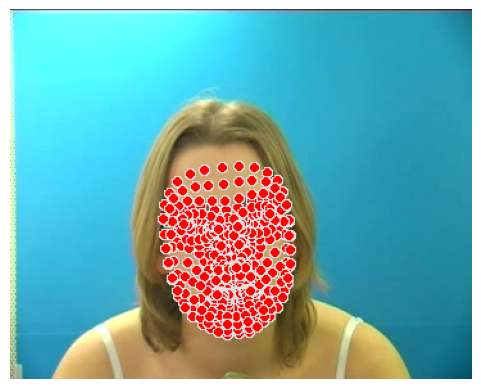

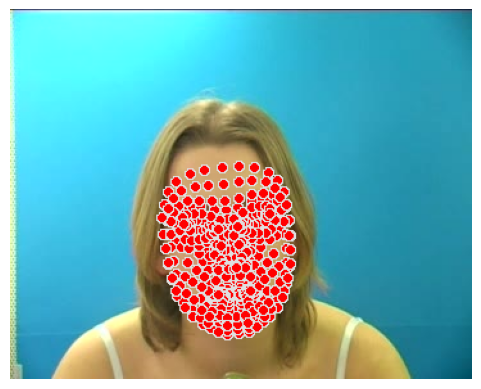

...

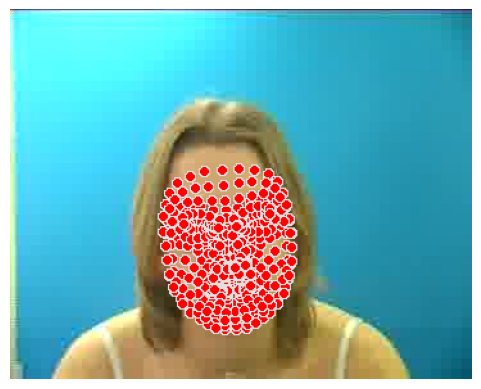

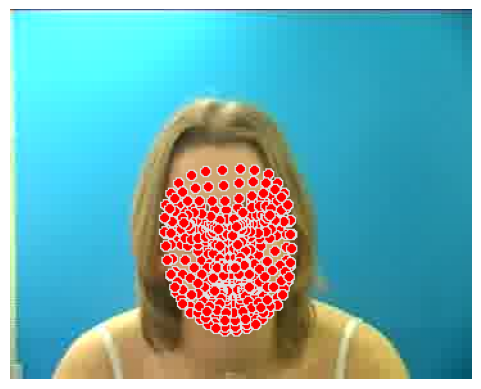

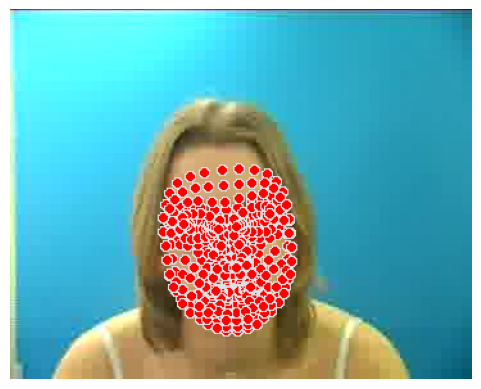

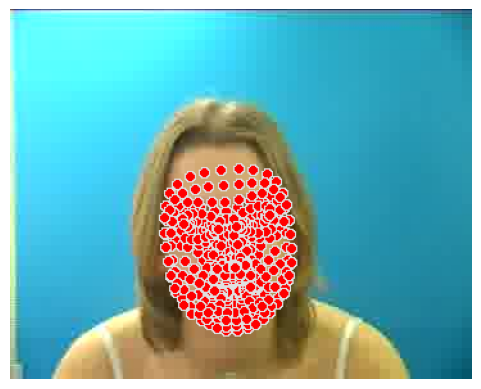

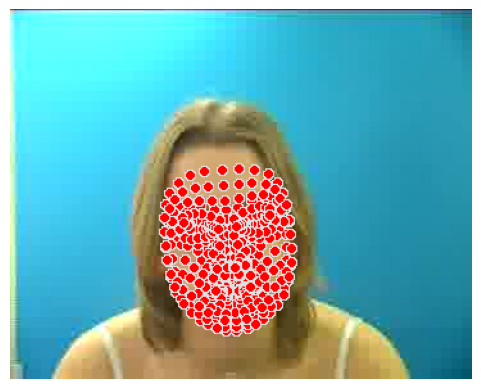

In [19]:
import subprocess
import os
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

# Path to your MPG video
input_video_path = '/content/bbal1s.mpg'

# Create a directory to store extracted frames
output_dir = 'output_frames'
os.makedirs(output_dir, exist_ok=True)

# Use subprocess to run ffmpeg command to extract frames
subprocess.run(['ffmpeg', '-i', input_video_path, os.path.join(output_dir, 'frame_%04d.jpg')])

# Initialize MediaPipe FaceMesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh()

# Loop through all extracted frames
for frame_num in range(1, len(os.listdir(output_dir)) + 1):
    # Construct the frame path
    frame_path = os.path.join(output_dir, f'frame_{frame_num:04d}.jpg')

    # Read the frame
    frame = cv2.imread(frame_path)

    # Convert to RGB for MediaPipe
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Process the frame and detect face landmarks
    results = face_mesh.process(frame_rgb)

    # Draw the landmarks on the frame
    if results.multi_face_landmarks:
        for landmarks in results.multi_face_landmarks:
            mp.solutions.drawing_utils.draw_landmarks(frame, landmarks, mp_face_mesh.FACEMESH_LIPS)

    # Show the processed frame with lip landmarks
    frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
    plt.imshow(frame_bgr)
    plt.axis('off')
    plt.show()


Extracting frames from the video...
Frames extracted and saved in /content/lip_frames
Processing frames for lip landmarks...
Cropped lip images saved in /content/cropped_lips
Applying data augmentation to cropped lips...
Augmented lip frames saved in /content/augmented_lip_frames
Displaying processed images...


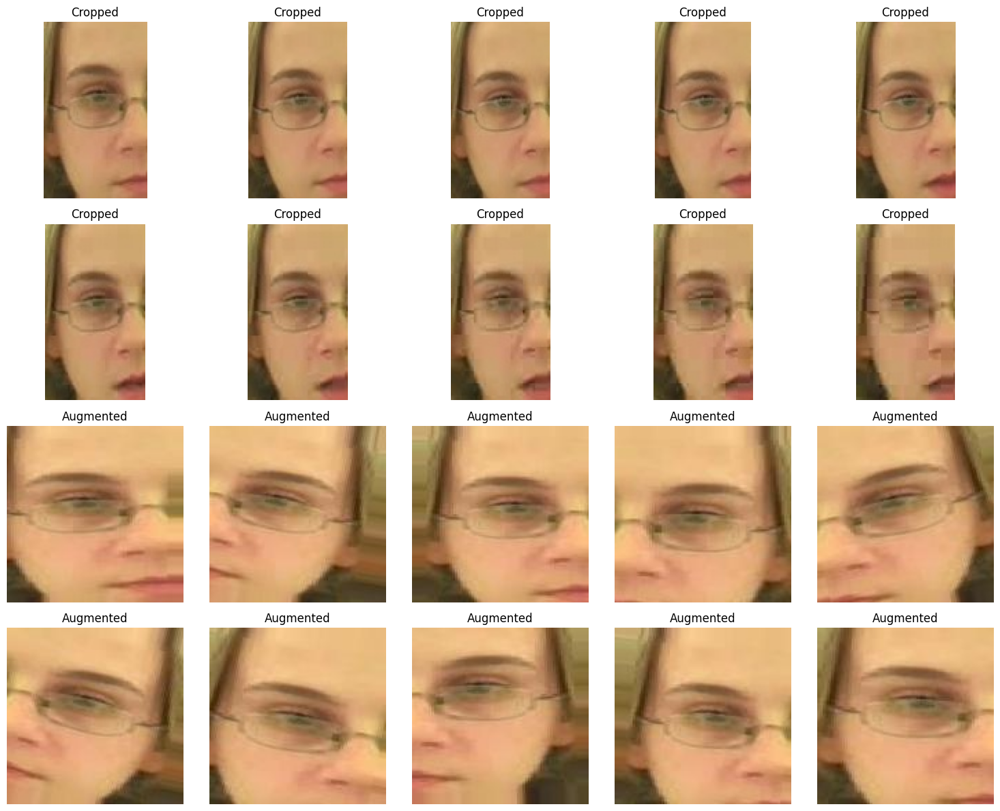

In [24]:
import cv2
import mediapipe as mp
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt
import numpy as np
import subprocess

# Path to the input MPG video
lip_video_path = '/content/bbal1s.mpg'  # Replace with your video path
output_frames_path = '/content/lip_frames'
augmented_data_path = '/content/augmented_lip_frames'

# Create directories for extracted frames and augmented data
os.makedirs(output_frames_path, exist_ok=True)
os.makedirs(augmented_data_path, exist_ok=True)

# Step 1: Extract frames from the MPG video
print("Extracting frames from the video...")
subprocess.run(['ffmpeg', '-i', lip_video_path, os.path.join(output_frames_path, 'frame_%04d.jpg')])
print(f"Frames extracted and saved in {output_frames_path}")

# Step 2: Initialize MediaPipe FaceMesh for lip detection
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh()
mp_drawing = mp.solutions.drawing_utils

# Step 3: Process each frame to extract and crop lips
cropped_lips_path = '/content/cropped_lips'
os.makedirs(cropped_lips_path, exist_ok=True)

print("Processing frames for lip landmarks...")
for frame_file in sorted(os.listdir(output_frames_path)):
    frame_path = os.path.join(output_frames_path, frame_file)
    frame = cv2.imread(frame_path)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Detect face landmarks
    results = face_mesh.process(frame_rgb)

    if results.multi_face_landmarks:
        for landmarks in results.multi_face_landmarks:
            # Get bounding box around lips
            h, w, c = frame.shape
            lip_coords = [(int(landmark.x * w), int(landmark.y * h)) for landmark in landmarks.landmark[48:68]]
            x_min = max(0, min([x for x, y in lip_coords]) - 10)
            x_max = min(w, max([x for x, y in lip_coords]) + 10)
            y_min = max(0, min([y for x, y in lip_coords]) - 10)
            y_max = min(h, max([y for x, y in lip_coords]) + 10)

            # Crop and save the lips region
            cropped_lip = frame[y_min:y_max, x_min:x_max]
            cropped_frame_path = os.path.join(cropped_lips_path, f'cropped_{frame_file}')
            cv2.imwrite(cropped_frame_path, cropped_lip)

print(f"Cropped lip images saved in {cropped_lips_path}")

# Step 4: Apply data augmentation to cropped lips
print("Applying data augmentation to cropped lips...")
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Process each cropped lip image
for lip_file in sorted(os.listdir(cropped_lips_path)):
    lip_path = os.path.join(cropped_lips_path, lip_file)
    img = tf.keras.preprocessing.image.load_img(lip_path, target_size=(128, 128))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Generate and save augmented images
    counter = 0
    for batch in datagen.flow(img_array, batch_size=1, save_to_dir=augmented_data_path,
                              save_prefix=lip_file.split('.')[0], save_format='jpg'):
        counter += 1
        if counter >= 5:  # Generate 5 augmented images per input image
            break

print(f"Augmented lip frames saved in {augmented_data_path}")

# Step 5: Display outputs in a grid
print("Displaying processed images...")
fig, axes = plt.subplots(4, 5, figsize=(15, 12))  # Adjust rows and cols for more images
axes = axes.flatten()

# Display a mix of cropped lips and augmented images
all_images = sorted(os.listdir(cropped_lips_path))[:10] + sorted(os.listdir(augmented_data_path))[:10]
for i, img_file in enumerate(all_images):
    img_path = os.path.join(cropped_lips_path if i < 10 else augmented_data_path, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[i].imshow(img_rgb)
    axes[i].axis('off')
    axes[i].set_title("Augmented" if i >= 10 else "Cropped")

plt.tight_layout()
plt.show()


In [27]:
subprocess.run(['ffmpeg', '-i', lip_video_path, os.path.join(output_frames_path, 'frame_%04d.jpg')])


CompletedProcess(args=['ffmpeg', '-i', '/content/bbal1s.mpg', '/content/lip_frames/frame_%04d.jpg'], returncode=0)

In [28]:
lip_coords = [(int(landmark.x * w), int(landmark.y * h)) for landmark in landmarks.landmark[48:68]]
x_min = max(0, min([x for x, y in lip_coords]) - 10)
x_max = min(w, max([x for x, y in lip_coords]) + 10)
y_min = max(0, min([y for x, y in lip_coords]) - 10)
y_max = min(h, max([y for x, y in lip_coords]) + 10)


In [29]:
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [30]:
for batch in datagen.flow(img_array, batch_size=1, save_to_dir=augmented_data_path, save_prefix=lip_file.split('.')[0], save_format='jpg'):
    counter += 1
    if counter >= 5:  # Generate 5 augmented images per input image
        break


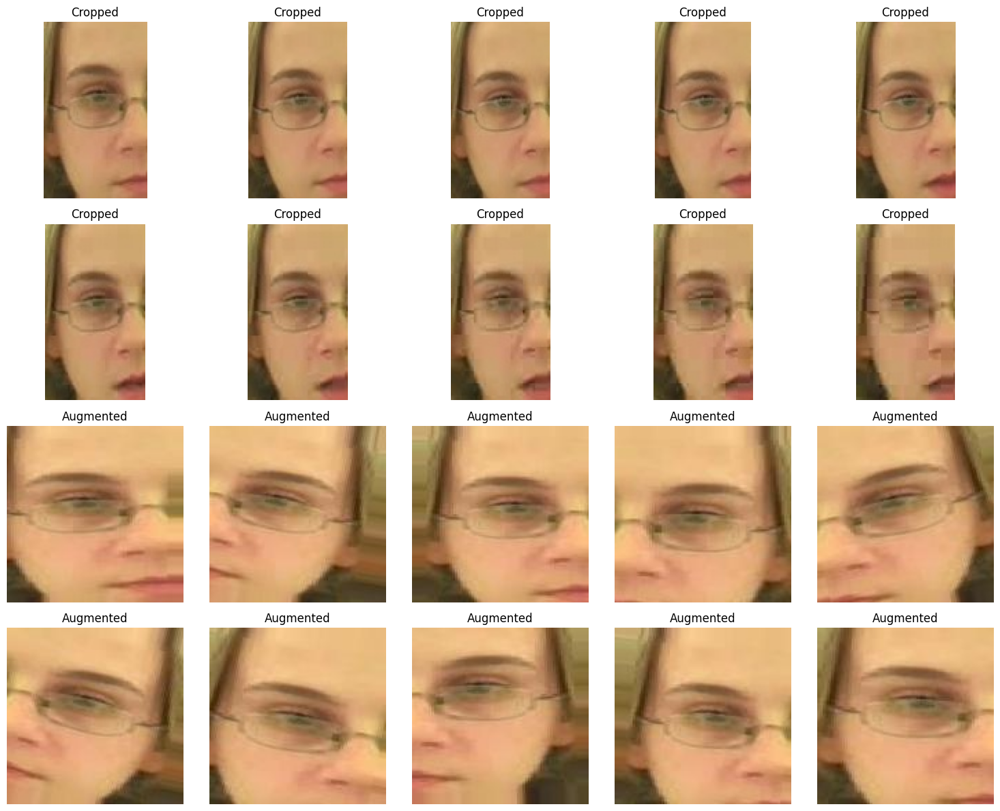

In [31]:
fig, axes = plt.subplots(4, 5, figsize=(15, 12))  # Adjust rows and cols for more images
axes = axes.flatten()

all_images = sorted(os.listdir(cropped_lips_path))[:10] + sorted(os.listdir(augmented_data_path))[:10]
for i, img_file in enumerate(all_images):
    img_path = os.path.join(cropped_lips_path if i < 10 else augmented_data_path, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[i].imshow(img_rgb)
    axes[i].axis('off')
    axes[i].set_title("Augmented" if i >= 10 else "Cropped")

plt.tight_layout()
plt.show()
